In [2]:
import pandas as pd
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import osmnx as ox
import networkx as nx
import numpy as np
from pyproj import CRS
from os import path
import math
from scipy import optimize
from shapely.geometry import Point, LineString, Polygon
from shapely.plotting import plot_polygon
from itables import show as itable
import warnings

In [3]:
ox.settings.use_cache=True

# Toronto Point-of-Interest Accessibility Analysis


## References

Isochrone calculations adapted from examples provided in the OSMnx examples repository [described here](https://geoffboeing.com/2017/08/isochrone-maps-osmnx-python/).

## Study Parameters

We will be using [EPSG:32616](https://epsg.io/32616), also known as WGS 84 of UTM Zone 17N due to area of use corrresponding with Toronto region.

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

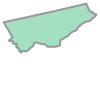

Stored 'wgs84' (CRS)
Stored 'study_bounds' (Polygon)
Stored 'wgs84_study_bounds' (Polygon)
Stored 'trip_times' (list)
Stored 'travel_speed' (float)
Stored 'network_type' (str)


In [4]:
wgs84 = CRS.from_string("EPSG:32617") # Set the CRS for rest of the study.
display(wgs84)

study_bounds = gpd.read_file("./data/Boundaries/toronto_bound.shp").to_crs("EPSG:4326")["geometry"].iloc[0]
wgs84_study_bounds = gpd.read_file("./data/Boundaries/toronto_bound.shp").to_crs(wgs84)["geometry"].iloc[0]
display(study_bounds)

# configure the place, network type, trip times, and travel speed
trip_times = [5, 15, 30] #in minutes
travel_speed = 4.5 #walking speed in km/hour
network_type = "walk"

%store wgs84 study_bounds wgs84_study_bounds trip_times travel_speed network_type

## Figure Parameters

In [4]:
figsize = (9, 6)
dpi = 900

%store figsize dpi

Stored 'figsize' (tuple)
Stored 'dpi' (int)


## Import Data

### Walkable Paths

In [28]:
# Alternative download for network
graph_data_location = "./data/toronto_osmnx.graphml"
if (not path.isfile("./data/toronto_osmnx.graphml")):
    print("Downloading file...")
    graph = ox.graph_from_polygon(study_bounds, network_type=network_type)

    # project to the same units
    graph = ox.project_graph(graph, to_crs=wgs84)
    
    ox.save_graphml(graph, filepath=graph_data_location)
    print("Done and saved.")
else: 
    # load directly from saved data
    print("Loading from file...")
    graph = ox.load_graphml(filepath=graph_data_location)
    
    # add an edge attribute for time in minutes required to traverse each edge
    # performed on load to mitigate bug with graph data type serialization(?)
    print("Calculating travel times...")
    meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute
    for u, v, k, data in graph.edges(data=True, keys=True):
        data['time'] = data['length'] / meters_per_minute

    print("Done.")

Loading from file...
Calculating travel times...
Done.


### TTC Routes

In [6]:
ttc_routes = gpd.read_file("./data/TTC Routes/RTP_TRANSIT_NETWORK.shp").to_crs(wgs84).clip(wgs84_study_bounds)

display(ttc_routes.info())
display(ttc_routes.crs)
itable(ttc_routes.drop(columns="geometry"))

%store ttc_routes

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 52 entries, 86 to 92
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   STATUS      52 non-null     object  
 1   TECHNOLOGY  52 non-null     object  
 2   NAME        52 non-null     object  
 3   Shape_Leng  52 non-null     float64 
 4   geometry    52 non-null     geometry
dtypes: float64(1), geometry(1), object(3)
memory usage: 2.4+ KB


None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'ttc_routes' (GeoDataFrame)


### TTC Points

In [7]:
ttc_points = gpd.read_file("./data/TTC Routes/RTP_POINTS.shp").to_crs(wgs84).clip(wgs84_study_bounds)

display(ttc_points.info())
display(ttc_points.crs)
itable(ttc_points.drop(columns="geometry"))

%store ttc_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 198 entries, 268 to 194
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   LOCATION_N  198 non-null    object  
 1   STATUS      198 non-null    object  
 2   TECHNOLOGY  198 non-null    object  
 3   NAME        198 non-null    object  
 4   geometry    198 non-null    geometry
dtypes: geometry(1), object(4)
memory usage: 9.3+ KB


None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'ttc_points' (GeoDataFrame)


### Hospital Points

In [8]:
hospital_points = gpd.read_file("./data/POI/centroid_hospital.shp").to_crs(wgs84).clip(wgs84_study_bounds)

display(hospital_points.info())
display(hospital_points.crs)
itable(hospital_points.drop(columns="geometry"))

%store hospital_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, 4 to 17
Data columns (total 44 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     37 non-null     object  
 1   osm_id      37 non-null     object  
 2   osm_type    37 non-null     object  
 3   amenity     37 non-null     object  
 4   stars_syst  1 non-null      object  
 5   stars       1 non-null      object  
 6   long_name   1 non-null      object  
 7   toilets_wh  5 non-null      object  
 8   opening_ho  2 non-null      object  
 9   opendata_t  1 non-null      object  
 10  wikipedia_  1 non-null      object  
 11  fax         1 non-null      object  
 12  addr_provi  4 non-null      object  
 13  old_name    2 non-null      object  
 14  healthcare  2 non-null      object  
 15  canvec_UUI  1 non-null      object  
 16  canvec_COD  1 non-null      object  
 17  building    1 non-null      object  
 18  attributio  1 non-null      object  
 19  wheelch

None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'hospital_points' (GeoDataFrame)


### Pharmacy Points

In [9]:
pharmacy_points = gpd.read_file("./data/POI/centroid_pharmacies.shp").to_crs(wgs84).clip(wgs84_study_bounds)
display(hospital_points.info())
display(hospital_points.crs)
itable(hospital_points.drop(columns="geometry"))

%store pharmacy_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, 4 to 17
Data columns (total 44 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     37 non-null     object  
 1   osm_id      37 non-null     object  
 2   osm_type    37 non-null     object  
 3   amenity     37 non-null     object  
 4   stars_syst  1 non-null      object  
 5   stars       1 non-null      object  
 6   long_name   1 non-null      object  
 7   toilets_wh  5 non-null      object  
 8   opening_ho  2 non-null      object  
 9   opendata_t  1 non-null      object  
 10  wikipedia_  1 non-null      object  
 11  fax         1 non-null      object  
 12  addr_provi  4 non-null      object  
 13  old_name    2 non-null      object  
 14  healthcare  2 non-null      object  
 15  canvec_UUI  1 non-null      object  
 16  canvec_COD  1 non-null      object  
 17  building    1 non-null      object  
 18  attributio  1 non-null      object  
 19  wheelch

None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'pharmacy_points' (GeoDataFrame)


### Restaurant Points

In [10]:
restaurant_points = gpd.read_file("./data/POI/centroid_restaurants.shp").to_crs(wgs84).clip(wgs84_study_bounds)


display(hospital_points.info())
display(hospital_points.crs)
itable(hospital_points.drop(columns="geometry"))

%store restaurant_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 37 entries, 4 to 17
Data columns (total 44 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     37 non-null     object  
 1   osm_id      37 non-null     object  
 2   osm_type    37 non-null     object  
 3   amenity     37 non-null     object  
 4   stars_syst  1 non-null      object  
 5   stars       1 non-null      object  
 6   long_name   1 non-null      object  
 7   toilets_wh  5 non-null      object  
 8   opening_ho  2 non-null      object  
 9   opendata_t  1 non-null      object  
 10  wikipedia_  1 non-null      object  
 11  fax         1 non-null      object  
 12  addr_provi  4 non-null      object  
 13  old_name    2 non-null      object  
 14  healthcare  2 non-null      object  
 15  canvec_UUI  1 non-null      object  
 16  canvec_COD  1 non-null      object  
 17  building    1 non-null      object  
 18  attributio  1 non-null      object  
 19  wheelch

None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'restaurant_points' (GeoDataFrame)


### University Points

In [11]:
university_points = gpd.read_file("./data/POI/centroid_universities.shp").to_crs(wgs84).clip(wgs84_study_bounds)


display(university_points.info())
display(university_points.crs)
itable(university_points.drop(columns="geometry"))

%store university_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 492 entries, 445 to 462
Data columns (total 87 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     492 non-null    object  
 1   osm_id      492 non-null    object  
 2   osm_type    492 non-null    object  
 3   website     12 non-null     object  
 4   start_date  1 non-null      object  
 5   name_en     3 non-null      object  
 6   memorial    1 non-null      object  
 7   historic    2 non-null      object  
 8   descriptio  8 non-null      object  
 9   railway     1 non-null      object  
 10  automated   1 non-null      object  
 11  addr_city   194 non-null    object  
 12  parking     2 non-null      object  
 13  operator    181 non-null    object  
 14  opening_ho  3 non-null      object  
 15  maxheight   2 non-null      object  
 16  fee         2 non-null      object  
 17  capacity_d  2 non-null      object  
 18  level       12 non-null     object  
 19  ame

None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'university_points' (GeoDataFrame)


### Shop Points

In [12]:
shop_points = gpd.read_file("./data/POI/centroid_shops.geojson").to_crs(wgs84).clip(wgs84_study_bounds)


display(shop_points.info())
display(shop_points.crs)
itable(shop_points.drop(columns="geometry"))

%store shop_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 13663 entries, 3851 to 6423
Columns: 398 entries, full_id to geometry
dtypes: geometry(1), object(397)
memory usage: 41.6+ MB


None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'shop_points' (GeoDataFrame)


### Residential Points

In [13]:
residential_points = gpd.read_file("./data/POI/centroid_residentials.shp").to_crs(wgs84).clip(wgs84_study_bounds)


display(residential_points.info())
display(residential_points.crs)
itable(residential_points.drop(columns="geometry"))

%store residential_points

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1255 entries, 203 to 533
Data columns (total 58 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     1255 non-null   object  
 1   osm_id      1255 non-null   object  
 2   osm_type    1255 non-null   object  
 3   fee         1 non-null      object  
 4   level       2 non-null      object  
 5   addr_provi  5 non-null      object  
 6   opendata_t  46 non-null     object  
 7   wheelchair  3 non-null      object  
 8   motor_vehi  1 non-null      object  
 9   foot        1 non-null      object  
 10  bicycle     1 non-null      object  
 11  barrier     1 non-null      object  
 12  parking     2 non-null      object  
 13  layer       3 non-null      object  
 14  amenity     7 non-null      object  
 15  access      1 non-null      object  
 16  addr_stree  771 non-null    object  
 17  addr_house  456 non-null    object  
 18  addr_city   142 non-null    object  
 19  en

None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'residential_points' (GeoDataFrame)


### Neighbourhood Populations

In [14]:
neighbourhood_populations_hist = pd.read_csv("./data/Population/neighbourhood-populations-1996-2016-140-model.csv")
neighbourhood_populations_curr = pd.read_csv("./data/Population/neighbourhood-populations-2021-140-158-model.csv")
neighbourhood_populations = neighbourhood_populations_hist.merge(
    right=neighbourhood_populations_curr,
    how="left",
    on="Neighbourhood Name"
)

neighbourhood_id_map = neighbourhood_populations[["Neighbourhood Name", "Neighbourhood Number"]]

neighbourhood_populations = neighbourhood_populations\
.set_index("Neighbourhood Name")\
.drop(index="City of Toronto")\
.fillna(0)

neighbourhood_populations.loc["Total"] = neighbourhood_populations.sum(numeric_only=True)

itable(neighbourhood_id_map)
itable(neighbourhood_populations)

%store neighbourhood_id_map neighbourhood_populations

Stored 'neighbourhood_id_map' (DataFrame)
Stored 'neighbourhood_populations' (DataFrame)


### Neighbourhood Boundaries

In [15]:
neighbourhood_bounds = gpd.read_file("./data/Boundaries/Neighbourhoods - historical 140 - 4326.shp")\
.to_crs(wgs84).clip(wgs84_study_bounds).merge(
    right=neighbourhood_id_map,
    how="left",
    left_on="_id1",
    right_on="Neighbourhood Number"
).drop(columns="_id1")


display(neighbourhood_bounds.info())
display(neighbourhood_bounds.crs)
itable(neighbourhood_bounds.drop(columns="geometry"))

%store neighbourhood_bounds

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   AREA_ID2              140 non-null    int64   
 1   AREA_AT3              140 non-null    int64   
 2   PARENT_4              140 non-null    int64   
 3   AREA_SH5              140 non-null    object  
 4   AREA_LO6              140 non-null    object  
 5   AREA_NA7              140 non-null    object  
 6   AREA_DE8              140 non-null    object  
 7   CLASSIF9              140 non-null    object  
 8   CLASSIF10             140 non-null    object  
 9   OBJECTI11             140 non-null    float64 
 10  geometry              140 non-null    geometry
 11  Neighbourhood Name    140 non-null    object  
 12  Neighbourhood Number  140 non-null    float64 
dtypes: float64(2), geometry(1), int64(3), object(7)
memory usage: 14.3+ KB


None

<Projected CRS: EPSG:32617>
Name: WGS 84 / UTM zone 17N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°W and 78°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Ecuador - north of equator. Canada - Nunavut; Ontario; Quebec. Cayman Islands. Colombia. Costa Rica. Cuba. Jamaica. Nicaragua. Panama. United States (USA).
- bounds: (-84.0, 0.0, -78.0, 84.0)
Coordinate Operation:
- name: UTM zone 17N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Stored 'neighbourhood_bounds' (GeoDataFrame)


### Generating Colors

In [16]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)

### Adding Nearest Intersections

In [17]:
# Find the closest node in the OSM graph
if not "nearest_graph_node" in ttc_points.columns: # Skip if already calculated
    def precise_node_at(p):
        x = p.x
        y = p.y
        nearest_node, distance = ox.distance.nearest_nodes(graph, x, y, return_dist=True)
        if distance <= 5000: # Maximum off by 5km
            return nearest_node
        else:
            return -1
    nearest_graph_node = ttc_points["geometry"].map(lambda p: precise_node_at(p))
    ttc_points = ttc_points.assign(nearest_graph_node = nearest_graph_node)

%store ttc_points

Stored 'ttc_points' (GeoDataFrame)


## Analysis for Current Toronto

### Select Only Existing Lines and Points

First, we will remove all non-existing routes and points.

,STATUS,TECHNOLOGY,NAME,Shape_Leng
97,Existing,Priority Bus,Spadina,3728.436599
58,Existing,GO Rail - 15-min,UP Express,24584.756191
90,Existing,Subway,Line 2: Bloor-Danforth Subway,26304.852783
56,Existing,Subway,Line 1: Yonge-University Subway,38405.045396
55,Existing,Subway,Line 4: Sheppard Subway,5364.853437
89,Existing (To Be Removed),Subway,Line 3: Scarborough RT,6463.346542
93,Existing,GO Rail - All-day,Lakeshore East Line,50931.950655
94,Existing,GO Rail - Peak & Limited Off-Peak,Stouffville Line,37806.893395
95,Existing,GO Rail - Peak Only,Richmond Hill Line,46220.590420
99,Existing,GO Rail - All-day,Lakeshore West Line,63281.109269


Stored 'existing_ttc_routes' (GeoDataFrame)


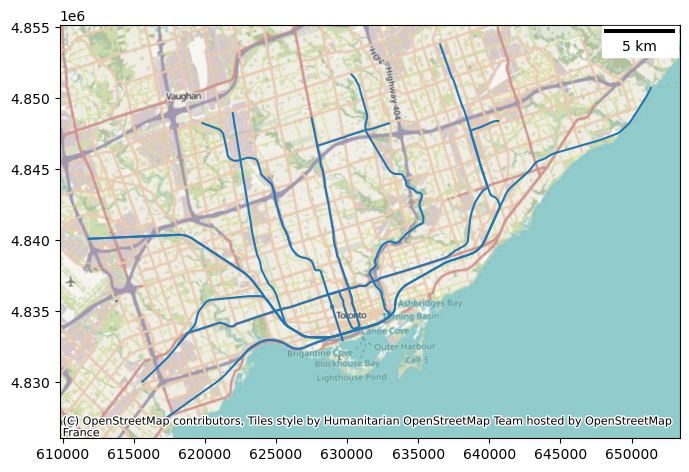

In [51]:
routes_bool_mask = (ttc_routes["STATUS"] == "Existing") | (ttc_routes["STATUS"] == "Existing (To Be Removed)")
existing_ttc_routes = ttc_routes[routes_bool_mask]
display(existing_ttc_routes.drop(columns="geometry"))
ttc_ax = existing_ttc_routes.plot(figsize=(8, 8))
cx.add_basemap(
    ttc_ax,
    crs = wgs84
)
ttc_ax.add_artist(ScaleBar(1))

%store existing_ttc_routes

Stored 'existing_ttc_points' (GeoDataFrame)


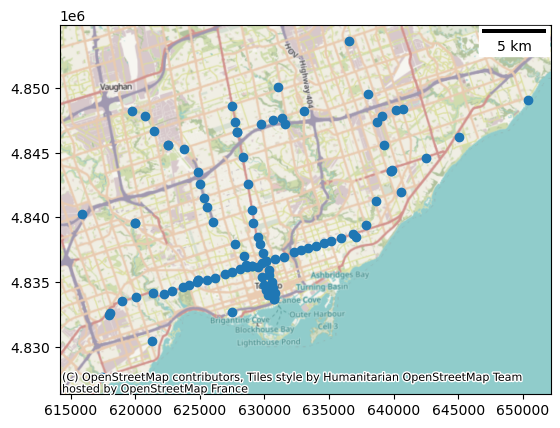

In [52]:
points_bool_mask = (ttc_points["STATUS"] == "Existing") | (ttc_points["STATUS"] == "Existing (To Be Removed)")
existing_ttc_points = ttc_points[points_bool_mask]
itable(existing_ttc_points.drop(columns="geometry"))
ttc_points_ax = existing_ttc_points.plot()

ttc_points_ax.add_artist(ScaleBar(1))
cx.add_basemap(ttc_points_ax, crs = wgs84)

%store existing_ttc_points

### Preparing Polygons for Isochrone Map

In [53]:
# Create polygons using convex hulls on ego graph
existing_ttc_iso_polys = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    for i, center_node in existing_ttc_points["nearest_graph_node"].items():
        if center_node == -1:
            continue
        subgraph = nx.ego_graph(graph, center_node, radius=trip_time, distance='time')
        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        if trip_time not in existing_ttc_iso_polys:
            existing_ttc_iso_polys[trip_time] = gpd.GeoDataFrame(existing_ttc_points)
        else:
            existing_ttc_iso_polys[trip_time].loc[i, "geometry"] = gpd.GeoSeries(data=node_points).unary_union.convex_hull

%store existing_ttc_iso_polys

Stored 'existing_ttc_iso_polys' (dict)


### Create Isochrone Map

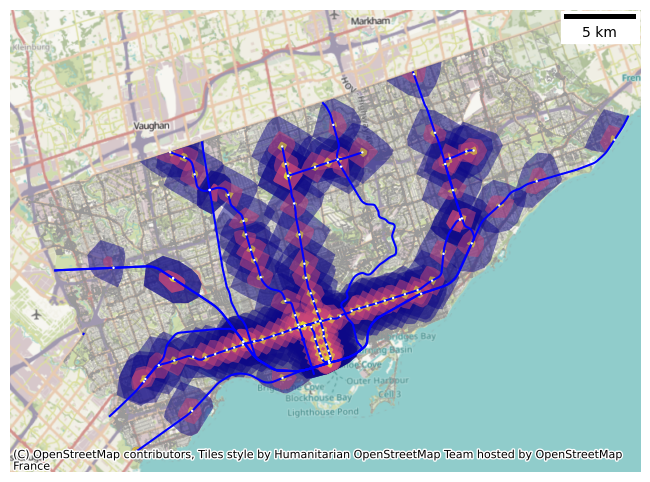

In [54]:
# plot the network then add isochrones as colored descartes polygon patches

fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)

ax.add_artist(ScaleBar(1))
# Add base map
cx.add_basemap(ax, crs = wgs84)

### Calculating Hospital Coverage

,time,reachable,portion
0,30.0,26,0.702703
1,15.0,15,0.405405
2,5.0,8,0.216216
3,inf,37,1.000000


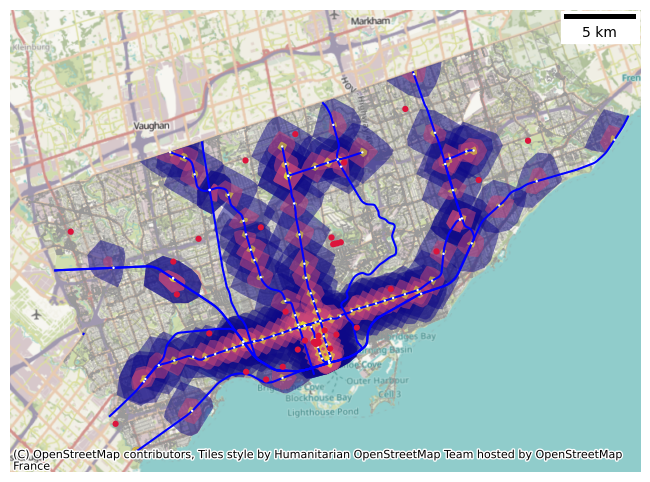

In [55]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_hospitals = hospital_points.plot(ax=ax, color="crimson", edgecolor="none", markersize=20, zorder=3)
ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

hospitals_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in hospital_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    hospitals_within_reach["time"].append(trip_time)
    hospitals_within_reach["reachable"].append(total)

hospitals_within_reach["time"].append(np.inf)
hospitals_within_reach["reachable"].append(len(hospital_points))

hospitals_within_reach = pd.DataFrame(hospitals_within_reach)

hospitals_within_reach["proportion accessible"] = hospitals_within_reach["reachable"] / len(hospital_points)

display(hospitals_within_reach)

### Calculating Pharmacy Coverage

,time,reachable,portion
0,30.0,440,0.697306
1,15.0,260,0.412044
2,5.0,111,0.175911
3,inf,631,1.000000


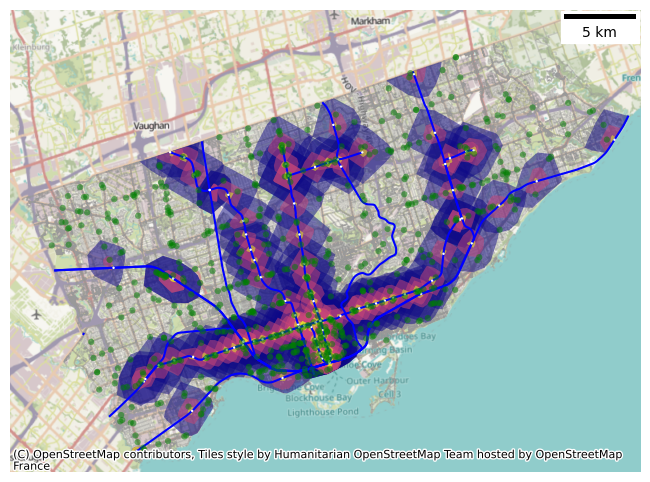

In [56]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_pharmacies = pharmacy_points.plot(ax=ax, color="green", edgecolor="none", alpha=0.5, markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

pharmacies_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in pharmacy_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    pharmacies_within_reach["time"].append(trip_time)
    pharmacies_within_reach["reachable"].append(total)

pharmacies_within_reach["time"].append(np.inf)
pharmacies_within_reach["reachable"].append(len(pharmacy_points))

pharmacies_within_reach = pd.DataFrame(pharmacies_within_reach)

pharmacies_within_reach["proportion accessible"] = pharmacies_within_reach["reachable"] / len(pharmacy_points)

display(pharmacies_within_reach)

### Calculating Restaurant Coverage

,time,reachable,portion
0,30.0,2511,0.824360
1,15.0,1527,0.501313
2,5.0,707,0.232108
3,inf,3046,1.000000


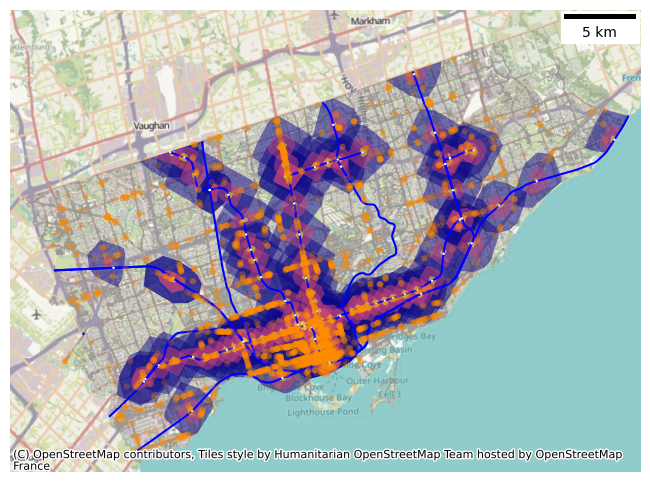

In [57]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_restaurants = restaurant_points.plot(ax=ax, color="darkorange", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

restaurants_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in restaurant_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    restaurants_within_reach["time"].append(trip_time)
    restaurants_within_reach["reachable"].append(total)

restaurants_within_reach["time"].append(np.inf)
restaurants_within_reach["reachable"].append(len(restaurant_points))

restaurants_within_reach = pd.DataFrame(restaurants_within_reach)

restaurants_within_reach["proportion accessible"] = restaurants_within_reach["reachable"] / len(restaurant_points)

display(restaurants_within_reach)

### Calculating University Coverage

,time,reachable,portion
0,30.0,437,0.888211
1,15.0,430,0.873984
2,5.0,159,0.323171
3,inf,492,1.000000


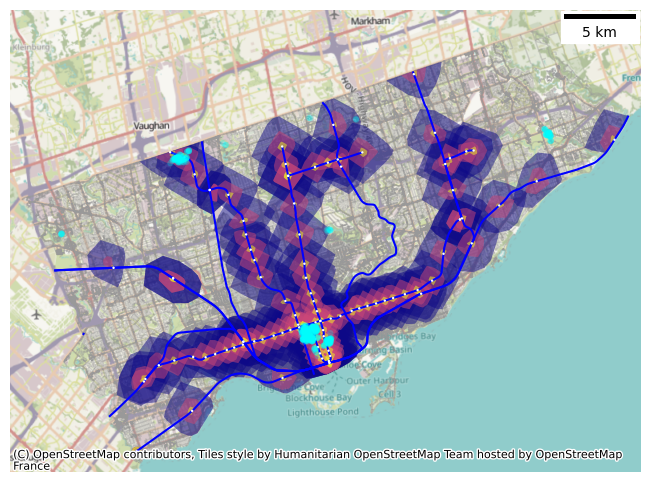

In [58]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_universities = university_points.plot(ax=ax, color="cyan", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

universities_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in university_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    universities_within_reach["time"].append(trip_time)
    universities_within_reach["reachable"].append(total)

universities_within_reach["time"].append(np.inf)
universities_within_reach["reachable"].append(len(university_points))

universities_within_reach = pd.DataFrame(universities_within_reach)

universities_within_reach["proportion accessible"] = universities_within_reach["reachable"] / len(university_points)

display(universities_within_reach)

### Calculating Shop Coverage

,time,reachable,portion
0,30.0,10191,0.745883
1,15.0,6201,0.453853
2,5.0,2566,0.187806
3,inf,13663,1.000000


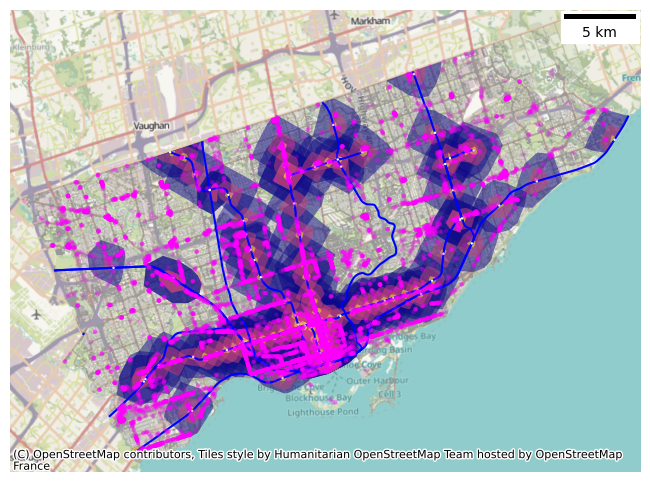

In [59]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_shops = shop_points.plot(ax=ax, color="magenta", edgecolor="none", alpha=0.25, markersize=10, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

shops_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in shop_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    shops_within_reach["time"].append(trip_time)
    shops_within_reach["reachable"].append(total)

shops_within_reach["time"].append(np.inf)
shops_within_reach["reachable"].append(len(shop_points))

shops_within_reach = pd.DataFrame(shops_within_reach)

shops_within_reach["proportion accessible"] = shops_within_reach["reachable"] / len(shop_points)

display(shops_within_reach)

### Calculating Residential Coverage

,time,reachable,portion
0,30.0,1195,0.952191
1,15.0,543,0.432669
2,5.0,43,0.034263
3,inf,1255,1.000000


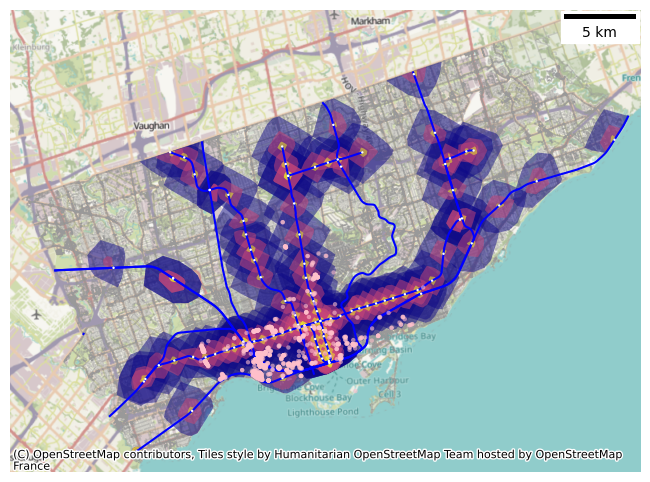

In [60]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    existing_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_residentials = residential_points.plot(ax=ax, color="pink", edgecolor="none", alpha=0.6, markersize=10, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

residentials_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = existing_ttc_iso_polys[trip_time]
    for i, point in residential_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    residentials_within_reach["time"].append(trip_time)
    residentials_within_reach["reachable"].append(total)

residentials_within_reach["time"].append(np.inf)
residentials_within_reach["reachable"].append(len(residential_points))

residentials_within_reach = pd.DataFrame(residentials_within_reach)

residentials_within_reach["proportion accessible"] = residentials_within_reach["reachable"] / len(residential_points)

display(residentials_within_reach)

## Analysis for Future Toronto

### Select Lines and Points in the Future

First, we will remove all non-existing routes and points.

Stored 'future_ttc_routes' (GeoDataFrame)


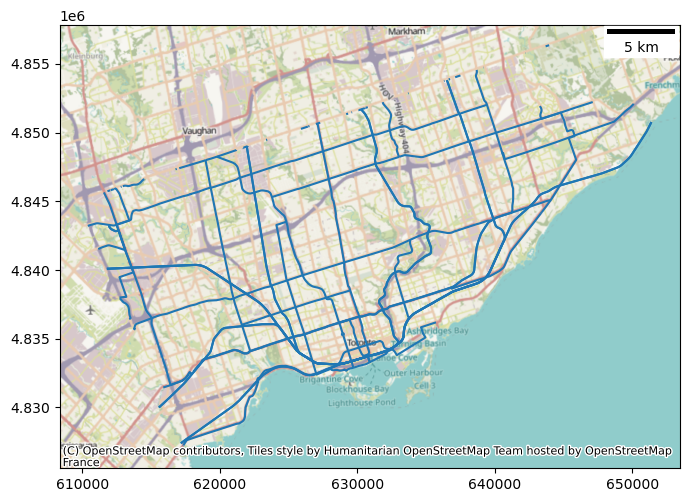

In [61]:
routes_bool_mask = ttc_routes["STATUS"] != "Existing (To Be Removed)"
future_ttc_routes = ttc_routes[routes_bool_mask]
itable(future_ttc_routes.drop(columns="geometry"))
ttc_ax = future_ttc_routes.plot(figsize=(8, 8))

ttc_ax.add_artist(ScaleBar(1))
cx.add_basemap(
    ttc_ax,
    crs = wgs84
)

%store future_ttc_routes

Stored 'future_ttc_points' (GeoDataFrame)


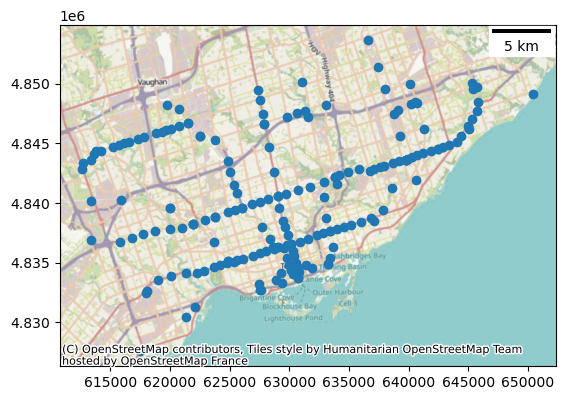

In [62]:
points_bool_mask = ttc_points["STATUS"] != "Existing (To Be Removed)"
future_ttc_points = ttc_points[points_bool_mask]
itable(future_ttc_points.drop(columns="geometry"))
ttc_points_ax = future_ttc_points.plot()

ttc_points_ax.add_artist(ScaleBar(1))
cx.add_basemap(ttc_points_ax, crs = wgs84)

%store future_ttc_points

### Preparing Polygons for Isochrone Map

In [63]:
# color the nodes according to isochrone then plot the street network
future_ttc_iso_polys = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    for i, center_node in future_ttc_points["nearest_graph_node"].items():
        if center_node == -1:
            continue
        subgraph = nx.ego_graph(graph, center_node, radius=trip_time, distance='time')
        node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
        if trip_time not in future_ttc_iso_polys:
            future_ttc_iso_polys[trip_time] = gpd.GeoDataFrame(future_ttc_points)
        else:
            future_ttc_iso_polys[trip_time].loc[i, "geometry"] = gpd.GeoSeries(data=node_points).unary_union.convex_hull

%store future_ttc_iso_polys

Stored 'future_ttc_iso_polys' (dict)


### Create Isochrone Map

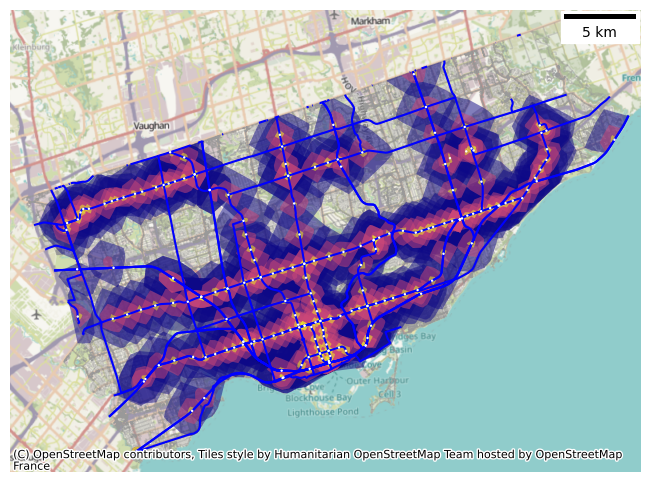

In [64]:
# plot the network then add isochrones as colored descartes polygon patches

fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)

# Add base map
ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

### Calculating Hospital Coverage

,time,reachable,portion
0,30.0,34,0.918919
1,15.0,24,0.648649
2,5.0,8,0.216216
3,inf,37,1.000000


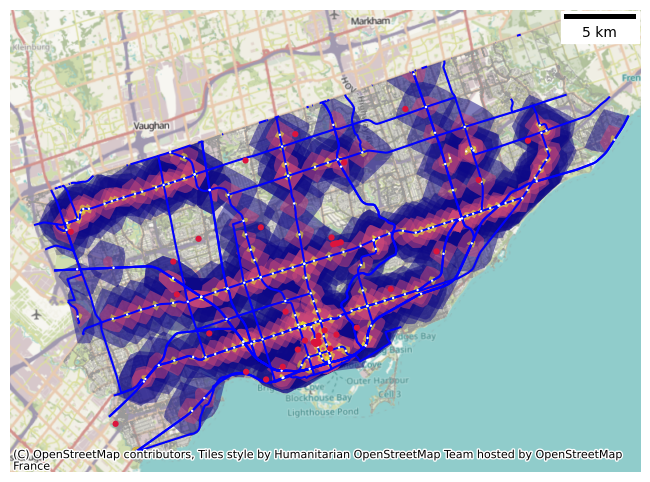

In [65]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_hospitals = hospital_points.plot(ax=ax, color="crimson", edgecolor="none", markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

hospitals_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in hospital_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    hospitals_within_reach["time"].append(trip_time)
    hospitals_within_reach["reachable"].append(total)

hospitals_within_reach["time"].append(np.inf)
hospitals_within_reach["reachable"].append(len(hospital_points))

hospitals_within_reach = pd.DataFrame(hospitals_within_reach)

hospitals_within_reach["proportion accessible"] = hospitals_within_reach["reachable"] / len(hospital_points)

display(hospitals_within_reach)

### Calculating Pharmacy Coverage

,time,reachable,portion
0,30.0,557,0.882726
1,15.0,375,0.594295
2,5.0,177,0.280507
3,inf,631,1.000000


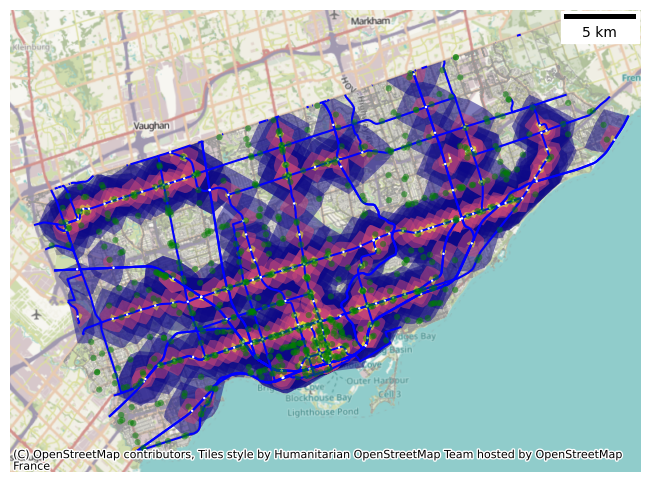

In [66]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_pharmacies = pharmacy_points.plot(ax=ax, color="green", edgecolor="none", alpha=0.5, markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

pharmacies_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in pharmacy_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    pharmacies_within_reach["time"].append(trip_time)
    pharmacies_within_reach["reachable"].append(total)

pharmacies_within_reach["time"].append(np.inf)
pharmacies_within_reach["reachable"].append(len(pharmacy_points))

pharmacies_within_reach = pd.DataFrame(pharmacies_within_reach)

pharmacies_within_reach["proportion accessible"] = pharmacies_within_reach["reachable"] / len(pharmacy_points)

display(pharmacies_within_reach)

### Calculating Restaurant Coverage

,time,reachable,portion
0,30.0,2834,0.930401
1,15.0,2101,0.689757
2,5.0,946,0.310571
3,inf,3046,1.000000


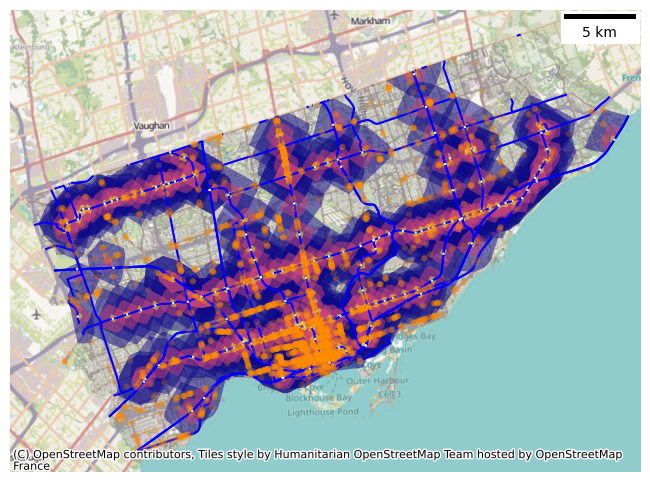

In [67]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_restaurants = restaurant_points.plot(ax=ax, color="darkorange", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

restaurants_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in restaurant_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    restaurants_within_reach["time"].append(trip_time)
    restaurants_within_reach["reachable"].append(total)

restaurants_within_reach["time"].append(np.inf)
restaurants_within_reach["reachable"].append(len(restaurant_points))

restaurants_within_reach = pd.DataFrame(restaurants_within_reach)

restaurants_within_reach["proportion accessible"] = restaurants_within_reach["reachable"] / len(restaurant_points)

display(restaurants_within_reach)

### Calculating University Coverage

,time,reachable,portion
0,30.0,487,0.989837
1,15.0,477,0.969512
2,5.0,175,0.355691
3,inf,492,1.000000


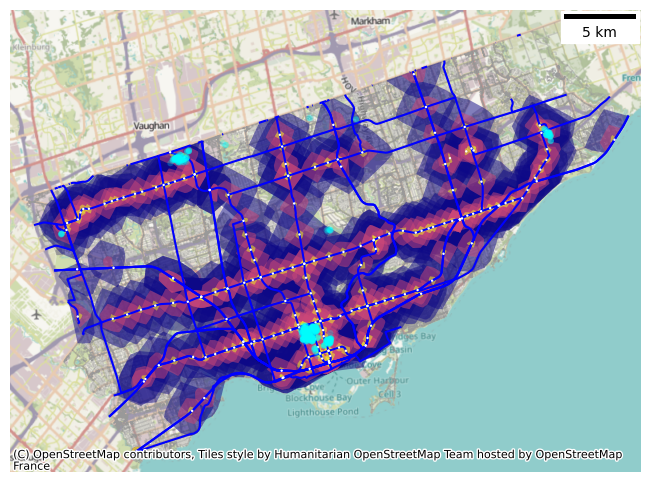

In [68]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_universities = university_points.plot(ax=ax, color="cyan", edgecolor="none", alpha=0.25, markersize=20, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

universities_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in university_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    universities_within_reach["time"].append(trip_time)
    universities_within_reach["reachable"].append(total)

universities_within_reach["time"].append(np.inf)
universities_within_reach["reachable"].append(len(university_points))

universities_within_reach = pd.DataFrame(universities_within_reach)

universities_within_reach["proportion accessible"] = universities_within_reach["reachable"] / len(university_points)

display(universities_within_reach)

### Calculating Shop Coverage

,time,reachable,portion
0,30.0,12191,0.892264
1,15.0,8740,0.639684
2,5.0,3909,0.286101
3,inf,13663,1.000000


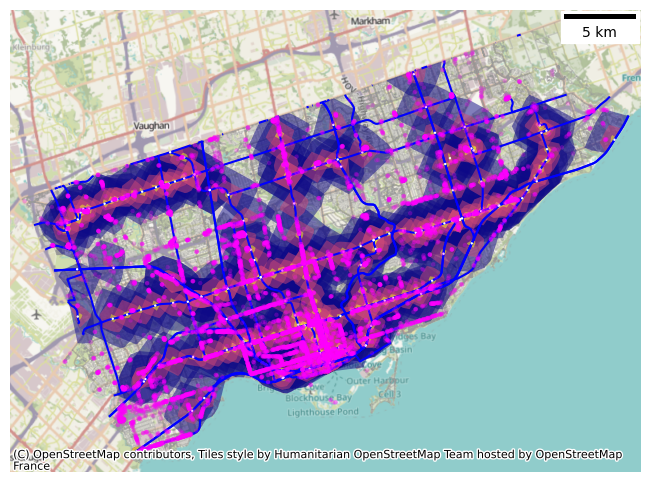

In [69]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()

added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_shops = shop_points.plot(ax=ax, color="magenta", edgecolor="none", alpha=0.25, markersize=10, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

shops_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in shop_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    shops_within_reach["time"].append(trip_time)
    shops_within_reach["reachable"].append(total)

shops_within_reach["time"].append(np.inf)
shops_within_reach["reachable"].append(len(shop_points))

shops_within_reach = pd.DataFrame(shops_within_reach)

shops_within_reach["proportion accessible"] = shops_within_reach["reachable"] / len(shop_points)

display(shops_within_reach)

### Calculating Residential Coverage

,time,reachable,portion
0,30.0,1246,0.992829
1,15.0,715,0.569721
2,5.0,90,0.071713
3,inf,1255,1.000000


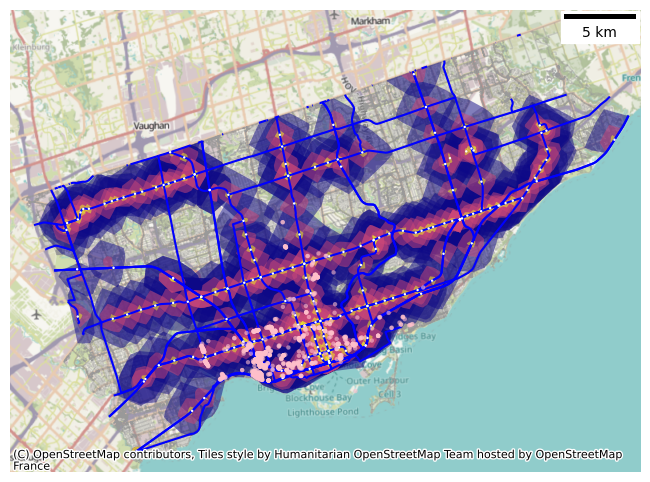

In [70]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot()


added_paths = ox.plot_graph(
    graph,
    ax=ax,
    show=False,
    close=False,
    edge_color='#999999',
    edge_alpha=0.2,
    node_size=0,
    bgcolor='k',
    node_zorder=-1
)
for trip_time, fc in zip(sorted(trip_times, reverse=True), iso_colors):
    future_ttc_iso_polys[trip_time].plot(ax=ax, color=fc, alpha=0.5)

# Plot the existing points of interest and other information
added_routes = future_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, zorder=1)
added_points = future_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, zorder=2)
added_residentials = residential_points.plot(ax=ax, color="pink", edgecolor="none", alpha=0.6, markersize=10, zorder=3)

ax.add_artist(ScaleBar(1))
cx.add_basemap(ax, crs = wgs84)

residentials_within_reach = {
    "time": [],
    "reachable": []
}
for trip_time in sorted(trip_times, reverse=True):
    total = 0
    polygons = future_ttc_iso_polys[trip_time]
    for i, point in residential_points["geometry"].items():
        total = total + (1 if polygons["geometry"].contains(point).any() else 0)
    residentials_within_reach["time"].append(trip_time)
    residentials_within_reach["reachable"].append(total)

residentials_within_reach["time"].append(np.inf)
residentials_within_reach["reachable"].append(len(residential_points))

residentials_within_reach = pd.DataFrame(residentials_within_reach)

residentials_within_reach["proportion accessible"] = residentials_within_reach["reachable"] / len(residential_points)

display(residentials_within_reach)

## Population Predictions

We'd like to calculate the growth of populations and see what it may look like by 2030. To do this, we will Gompertz model as described [here](https://mhasoba.github.io/TheMulQuaBio/notebooks/Appendix-NLLS-Python.html#fitting-non-linear-models-to-the-data).

In [34]:
snapshot_times = [1996, 2001, 2006, 2011, 2016, 2021]
snapshot_names = [str(time) for time in snapshot_times]
total_population = list(neighbourhood_populations[snapshot_names].transpose()["Total"])

neighbourhood_geom_pop = neighbourhood_bounds[["Neighbourhood Name", "Neighbourhood Number", "geometry"]]\
.merge(
    right=neighbourhood_populations,
    how="left",
    on="Neighbourhood Number"
).drop(columns="Neighbourhood Number")

itable(neighbourhood_geom_pop.drop(columns="geometry"))

In [35]:
toronto_neighbourhood_start = 1996

Rate: 15676.56556454784, Initial Population: 2383421.43044327
Estimated population in 2030: 2916424.659637897


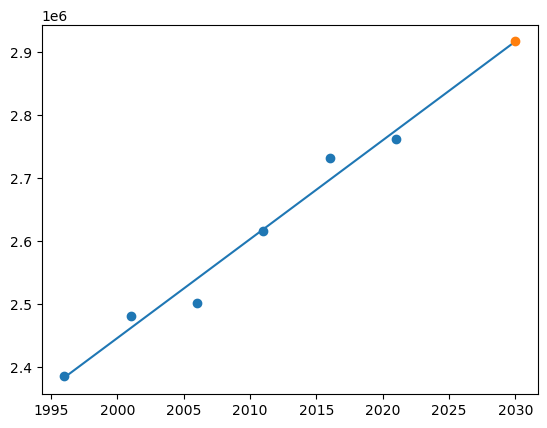

In [45]:
def pop_linear(t, rate, initial):
    return rate*(t - toronto_neighbourhood_start) + initial

def predict_future_pop_linear(pop, time, year):
    pop = list(pop)
    time = list(time)
    popt, pcov = optimize.curve_fit(
        pop_linear,
        xdata=time,
        ydata=pop,
        p0=[(pop[-1] - pop[1]) / (time[-1] - time[0]), pop[0]]
    )
    return round(pop_linear(year, *popt))

# Show fit curves for total population
popt, pcov = optimize.curve_fit(
    pop_linear,
    xdata=snapshot_times,
    ydata=total_population,
    p0=[
        (total_population[-1] - total_population[1]) / \
        (snapshot_times[-1] - snapshot_times[0]), 
        total_population[0]
    ]
)
fig = plt.figure(1)
plt.clf()
x_samples = np.linspace(snapshot_times[0], 2030, 70)
plt.plot(x_samples, pop_linear(x_samples, *popt), zorder=-1)
plt.scatter(snapshot_times, total_population)
future_est = pop_linear(2030, *popt)
plt.scatter(2030, future_est)
print("Rate: {0}, Initial Population: {1}".format(*popt))
print(f"Estimated population in 2030: {future_est}")

Initial Population: 2386029.220794438, Rate: 0.008151468020634822, Carrying Capacity: 10165306.34690117
Estimated population in 2030: 2928513.997198901


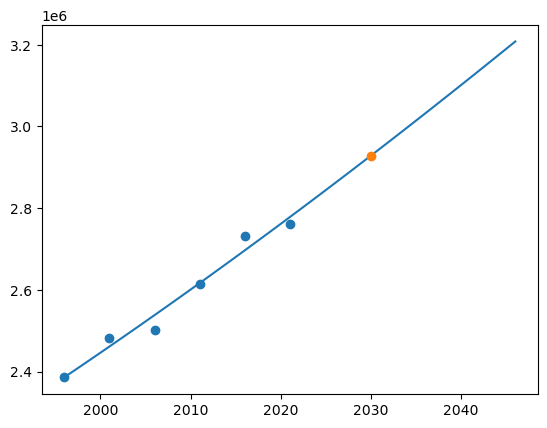

In [43]:
def pop_logistic(t, initial, rate, carrying_cap):
    return (carrying_cap) / \
    (1 + ((carrying_cap - initial) / initial) * np.exp(-rate*(t - toronto_neighbourhood_start)))

def predict_future_pop_logistic(pop, time, year):
    pop = list(pop)
    time = list(time)
    popt, pcov = optimize.curve_fit(
        pop_logistic,
        xdata=time,
        ydata=pop,
        p0=[pop[0], 0.05, pop[-1]]
    )
    return round(pop_logistic(year, *popt))

# Show fit curves for total population
total_population = list(neighbourhood_populations[snapshot_names].transpose()["Total"])

popt, pcov = optimize.curve_fit(
    pop_logistic,
    xdata=snapshot_times,
    ydata=total_population,
    p0=[total_population[0],
        0.025,
        total_population[-1]
    ]
)
fig = plt.figure(1)
plt.clf()
num_years = 50
x_samples = np.linspace(snapshot_times[0], snapshot_times[0] + num_years, num_years)
plt.plot(x_samples, pop_logistic(x_samples, *popt), zorder=-1)
plt.scatter(snapshot_times, total_population)
future_est = pop_logistic(2030, *popt)
plt.scatter(2030, future_est)
print("Initial Population: {0}, Rate: {1}, Carrying Capacity: {2}".format(*popt))
print(f"Estimated population in 2030: {future_est}")

In [46]:
def predict_future_pop(pop, time, year):
    with warnings.catch_warnings():
        warnings.simplefilter("error", optimize.OptimizeWarning)
        try:
            return predict_future_pop_logistic(pop, time, year), True
        except optimize.OptimizeWarning:
            return predict_future_pop_linear(pop, time, year), False

estimated_col_name = "Estimated 2030"
neighbourhood_geom_pop[[estimated_col_name, "Logistic"]] = pd.DataFrame(neighbourhood_geom_pop[snapshot_names].apply(lambda row: predict_future_pop(row, snapshot_times, 2030), axis=1).tolist())
itable(neighbourhood_geom_pop.drop(columns="geometry"))

The smallest population across all neighbourhoods and time periods is 5906.0
The largest population across all neighbourhoods and time periods is 125319.0


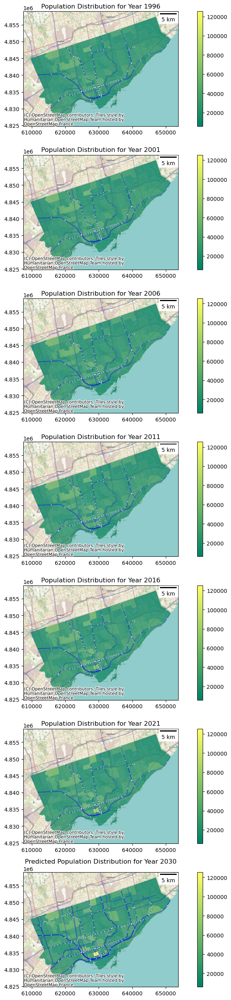

In [74]:
min_pop = neighbourhood_geom_pop[snapshot_names + [estimated_col_name]].min().min()
print(f"The smallest population across all neighbourhoods and time periods is {min_pop}")
max_pop = neighbourhood_geom_pop[snapshot_names + [estimated_col_name]].max().max()
print(f"The largest population across all neighbourhoods and time periods is {max_pop}")

fig, axes = plt.subplots(7, 1, figsize=(10, 26))
axes = axes.ravel()
for iax, snapshot in enumerate(snapshot_names):
    ax = axes[iax]
    ax.set_title(f"Population Distribution for Year {snapshot}")
    neighbourhood_geom_pop.plot(
        ax=ax,
        column=snapshot,
        cmap="summer",
        legend=True,
        alpha=0.8,
        vmin=min_pop,
        vmax=max_pop
    )
    existing_ttc_routes.plot(ax=ax, color="blue", edgecolor="none", markersize=1, alpha=0.25, zorder=1)
    existing_ttc_points.plot(ax=ax, color="white", edgecolor="none", markersize=3, alpha=0.75, zorder=2)
    cx.add_basemap(ax, crs=neighbourhood_geom_pop.crs)
    ax.add_artist(ScaleBar(1))

axes[6].set_title("Predicted Population Distribution for Year 2030")
neighbourhood_geom_pop.plot(
    ax=axes[6],
    column=estimated_col_name,
    cmap="summer",
    legend=True,
    alpha=0.8,
    vmin=min_pop,
    vmax=max_pop
)
future_ttc_routes.plot(ax=axes[6], color="blue", edgecolor="none", markersize=1, alpha=0.25, zorder=1)
future_ttc_points.plot(ax=axes[6], color="white", edgecolor="none", markersize=3, alpha=0.75, zorder=2)
cx.add_basemap(axes[6], crs=neighbourhood_geom_pop.crs)
axes[6].add_artist(ScaleBar(dx=1))

plt.tight_layout()